# **GITHUB SPONSORS - DATA EXTRACTION**
## DATA COLLECTION - PROJECT 2
## SOURCE CODE:
### (Created by Ritwik Chandra Pandey -  November 2021)

 ## **----------------------------------------------------------------------------------**
 

### LIBRARIES USED:
[os](https://docs.python.org/3/library/os.html),
[requests](https://docs.python-requests.org/en/latest/),
[pandas](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html),
[bs4](https://www.crummy.com/software/BeautifulSoup/bs4/doc/),
[time](https://docs.python.org/3/library/time.html).

In [72]:
import requests
import pandas as pd
import os
from bs4 import BeautifulSoup
import time

### Function 1 : **get_usernames( doc, details_dict )**
The role of this function is to extract the usernames of developers/organisations from the [GitHub sponsors page](https://github.com/sponsors/community). _doc_ is actually parsed HTML document ( of the page mentioned above ) and *details_dict* is a dictoionary consisting of 'username' as one of its keys. _doc_ is used to call *find_all()* function so as to locate all 'h1' tags having class 'h3 lh-condensed' because it is these tags that contain the usernames.  
The image below clarifies the situation by showing the html code for the usernames for one developer.  
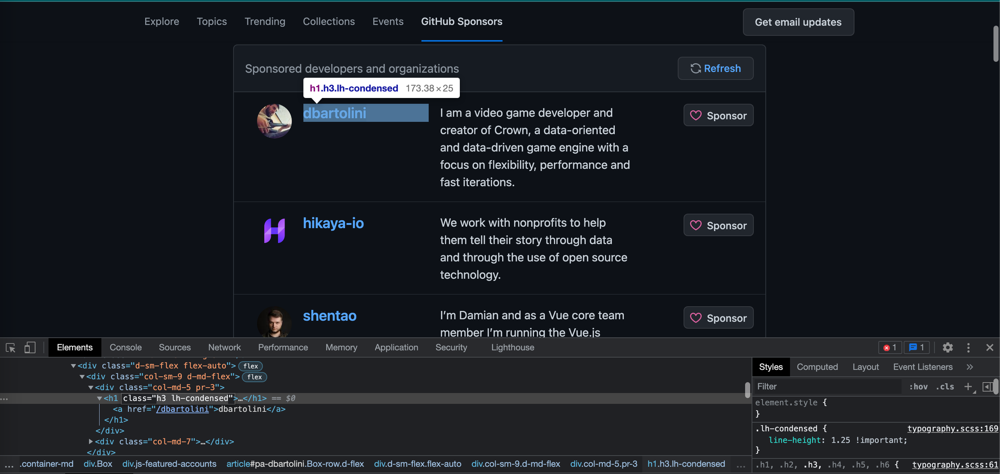
  
The usernames are appended one by one to the list which is the value of 'username' key. Details about this dictionary will be revealed later on when its declaration and initial values will be shown.

In [73]:
def get_usernames(doc,details_dict):
    us = doc.find_all('h1',{'class':'h3 lh-condensed'})
    for tag in us:
        details_dict['Username'].append(tag.text.strip())
    return

### Function 2 : **get_personal_info( doc, details_dict )**
This particular function gathers the information about the developer/organisation which appears beside the username. The methodology is same as *get_usernames()* fucntion and the picture below justifies the code for it.  

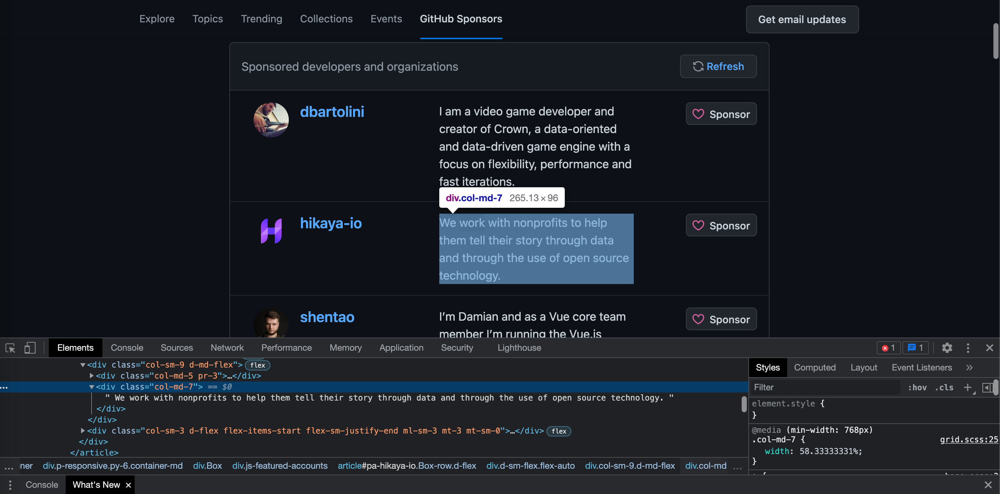

In [74]:
def get_personal_info(doc,details_dict):
    pi = doc.find_all('div',{'class':'col-md-7'})
    for tag in pi:
        details_dict['Info'].append(tag.text.strip())
    return   

### Function 3 : **parse_count( count )**
This function has a very small role. Actually, we have a number of things to extract about each developer/organisation. Some of the data revolves around numbers. In GitHub, any number greater than 1000, is usually displayed as a figure that ends with 'k', eg. 1800 as 1.8k. This function removes that 'k' in the end and returns that number as it is, like the example above. In case the number is less than 1000, the number is returned as it is. The argument *count* is actually a string which consists of a number, usually greater than 1000.

In [75]:
def parse_count(count):
    if(count[-1]=='k'):
        return int(float(count[:-1])*1000)
    else:
        return int(count)

### Function 4 : **get_full_name( doc )**
This function is used to extarct full_name of the developer/organisation, after getting into their public profile page. A sample public profile page for a developer has been given here for ease of understanding.  
 
 
( Profile Pic Dev )
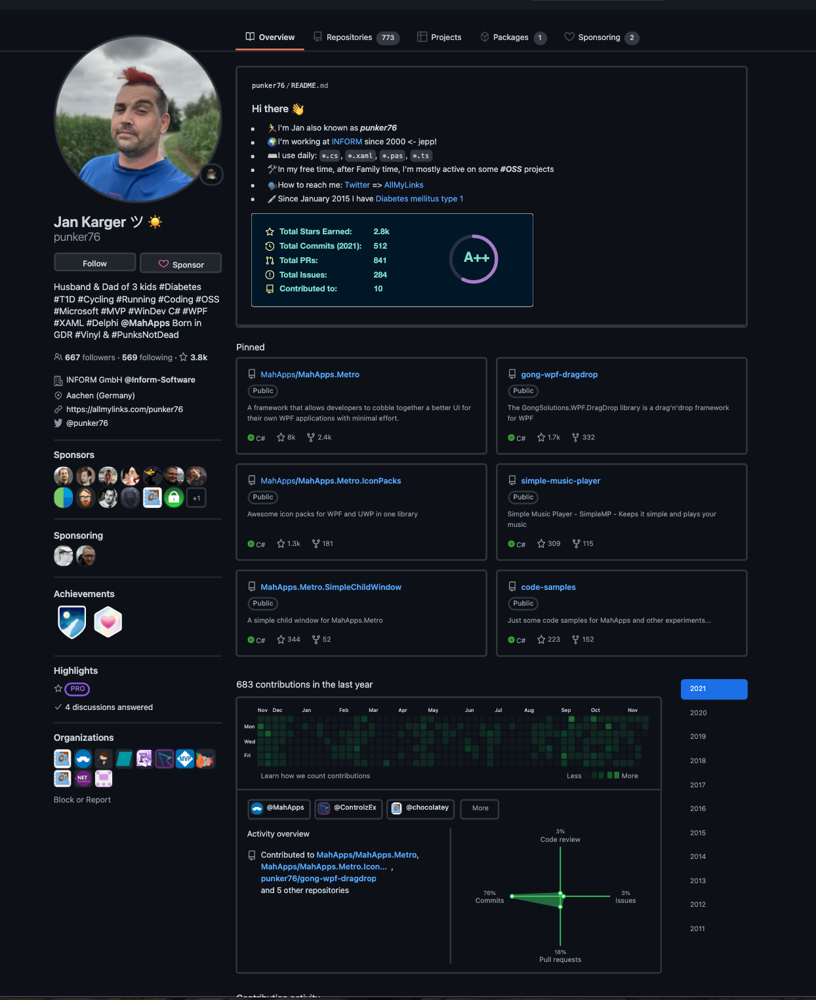



Also, a sample public profile page for an organisation looks something like this:  
    
    
( Profile Pic Org )    
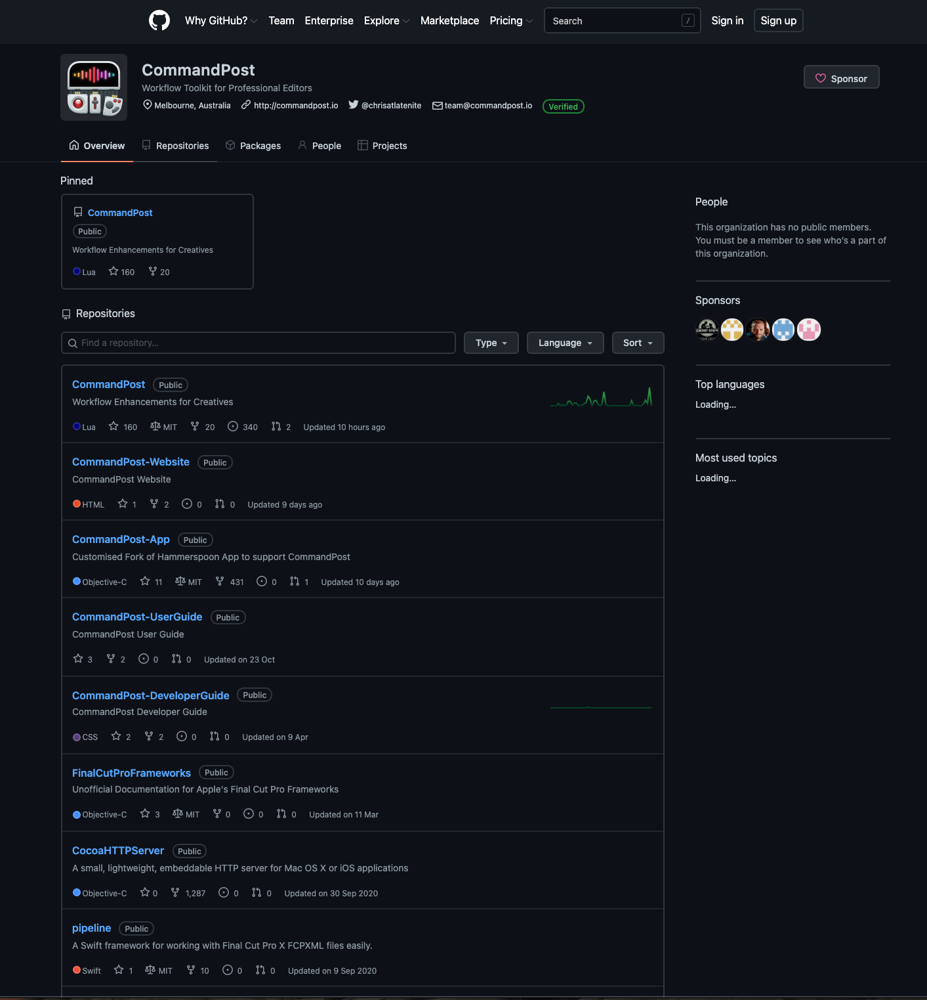  

Notice below that there is 'Full Name' for an organisation (CommandPost), but the html code which contains it, differs from that of a developer (Jan Karger). Thats why if *fn* below is an empty list, then it is understood that _doc_ (a parsed HTML document) is about a webpage of an organisation and not of a developer. In that case *status* variable is assigned 1. Ultimately, *status* and full name are returned.

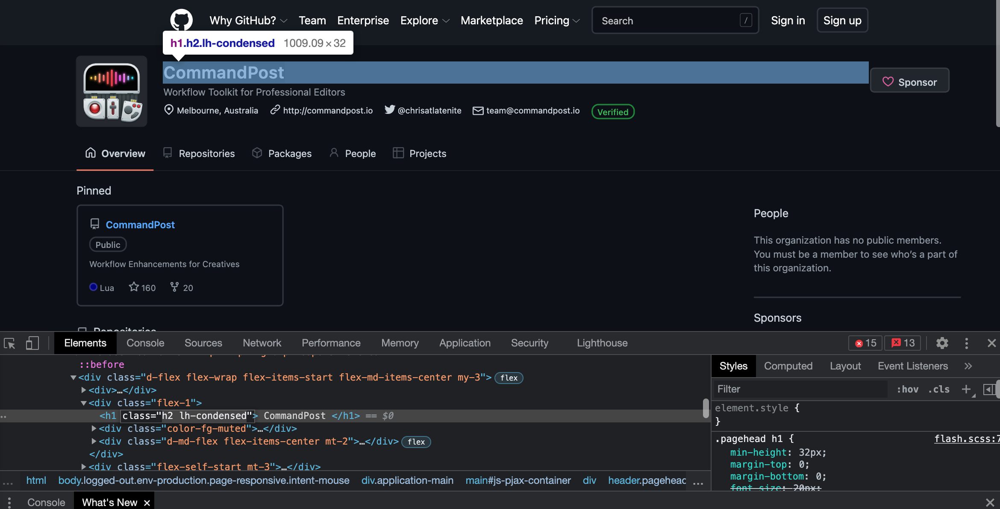

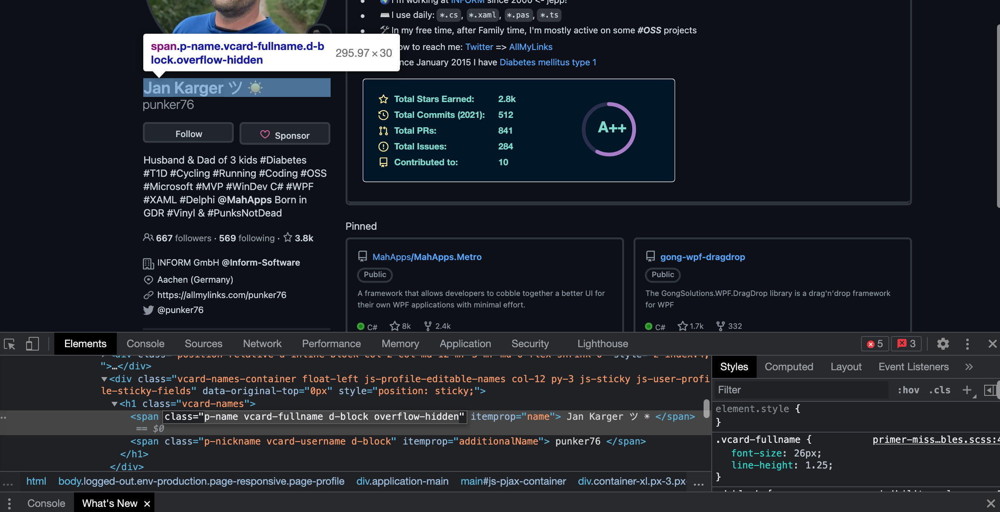

In [76]:
def get_full_name(doc):
    fn = doc.find_all('span',{'class':'p-name vcard-fullname d-block overflow-hidden'})
    if(fn == []):
        fn_org = doc.find_all('h1',{'class':'h2 lh-condensed'})
        status = 1
        return fn_org[0].text.strip(),status
    status = 0 
    return fn[0].text.strip(),status

### Function 5 : **get_followers ( doc, status )**
In this particular function, the aim is to get the no. of followers of the developer ( organisations don't have this ). *doc* happens to be same as the one in the previous function and *status* is actually one of the outputs of the previous function. If the *status* is 1, then clearly it is an organisation and thats why '-' is returned. On the other hand, for developers, 'span' tag is found and the count is extracted from there. The return value happens to be *parse_count(f13)*, so as to get the answer in pure numbers.  

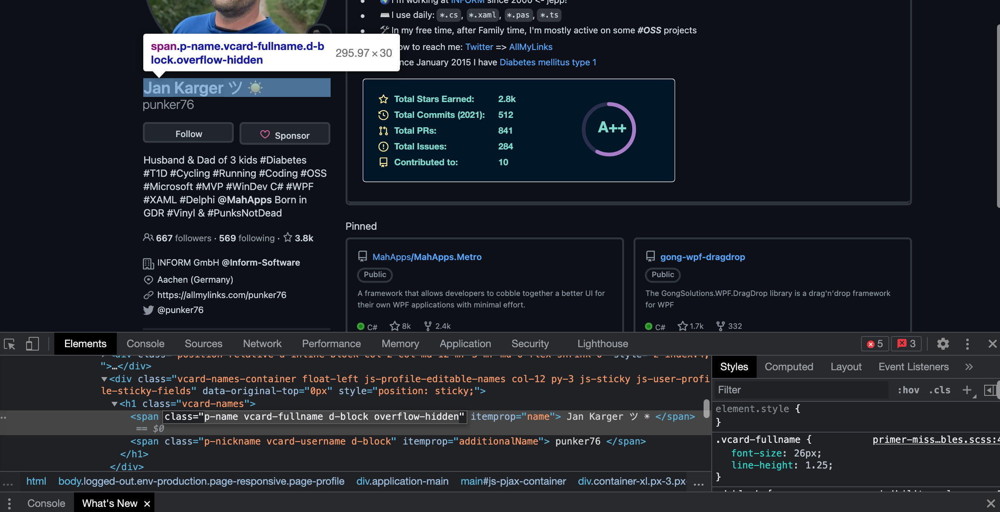

In [77]:
def get_followers(doc,status):
    if status==1:
        return '-'
    fl1 = doc.find_all('div',{'class':'mb-3'})
    fl2 = fl1[3].find_all('a',{'class':'Link--secondary no-underline no-wrap'})
    fl3 = fl2[0].find('span',{'class':'text-bold color-fg-default'}).text
    return(parse_count(fl3)) 

### Function 6 : **get_following ( doc, status )**
In this particular function, the aim is to get the no. of developer/organaisations that the developer follows ( organisations don't have this ). *doc* and *status* happen to be same as the ones in the previous function. If the *status* is 1, then clearly it is an organisation and thats why '-' is returned. On the other hand, for developers, 'span' tag is found and the count is extracted from there. The return value happens to be *parse_count(fw3)*, so as to get the answer in pure numbers.  

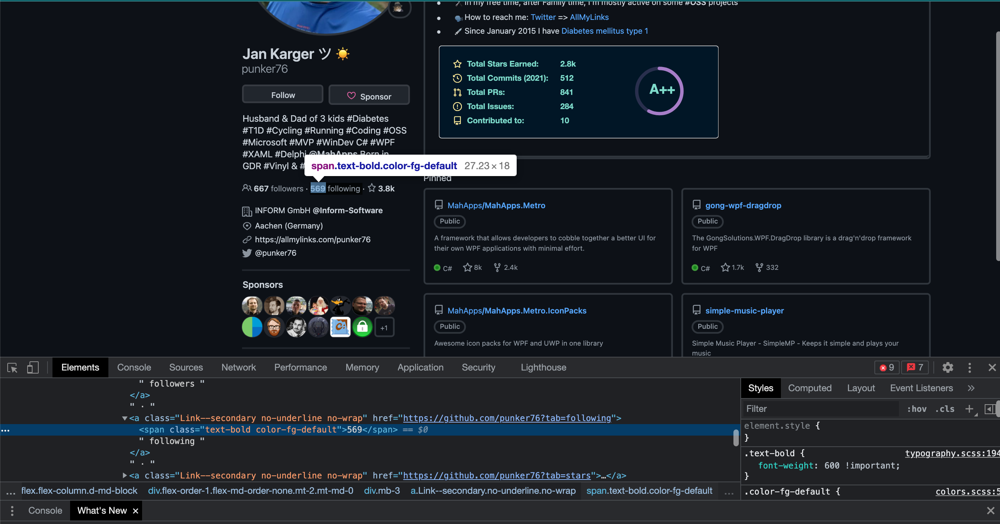

In [78]:
def get_following(doc,status):
    if status==1:
        return '-'
    fw1 = doc.find_all('div',{'class':'mb-3'})
    fw2 = fw1[3].find_all('a',{'class':'Link--secondary no-underline no-wrap'})
    fw3 = fw2[1].find('span',{'class':'text-bold color-fg-default'}).text
    return(parse_count(fw3))

### Function 7 : **get_no_of_stars ( doc, status )**
In this particular function, the aim is to get the no. of stars that the developer has earned over time ( organisations don't have this ). *doc* and *status* happen to be same as the ones in the previous function. If the *status* is 1, then clearly it is an organisation and thats why '-' is returned. On the other hand, for developers, 'span' tag is found and the count is extracted from there. The return value happens to be *parse_count(fs3)*, so as to get the answer in pure numbers.  

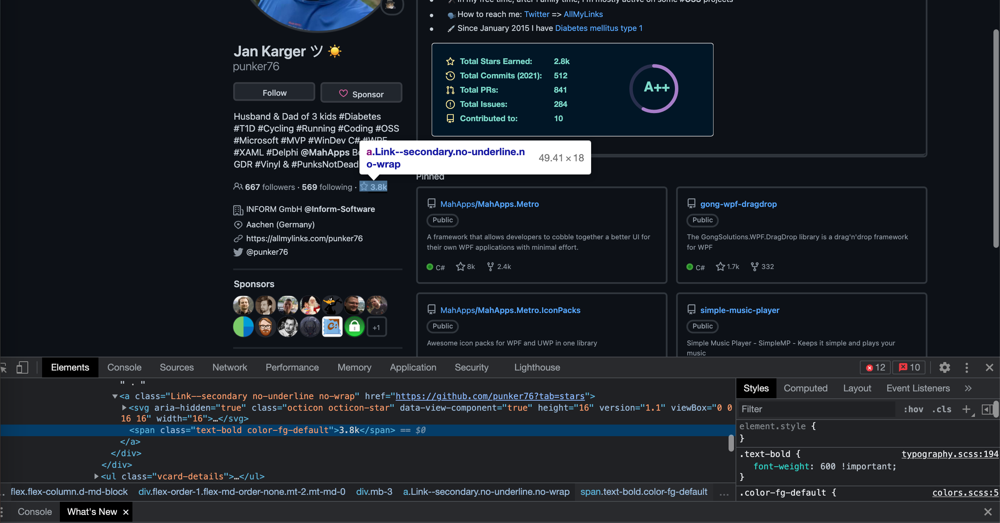

In [79]:
def get_no_of_stars(doc,status):
    if status==1:
        return '-'
    fs1 = doc.find_all('div',{'class':'mb-3'})
    fs2 = fs1[3].find_all('a',{'class':'Link--secondary no-underline no-wrap'})
    fs3 = fs2[2].find('span',{'class':'text-bold color-fg-default'}).text
    return(parse_count(fs3))

### Function 8 : **get_location ( doc, status )**
This function returns the location of the organoisation/developer. *doc* and *status* happen to be same as the ones in the previous function. In case *status* is 1, it is confirmed that it is an organisation. Now, if the organisation has disclosed its location then *location* happens to be an empty list and '-' is returned. Otherwise, 'span' tags are found with a specific itemprop and from there location is extracted and returned.  

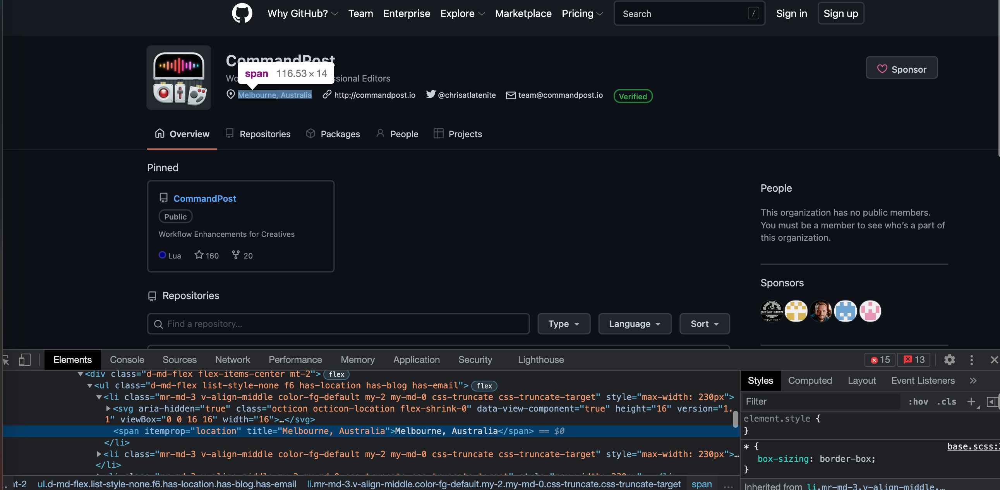

Moving on, for a developer also, if *loc* is empty ( developer refused to share his location ), '-' is returned. Otherwise, 'span' tags are found with a specific class as before and from there location is extracted and returned.  

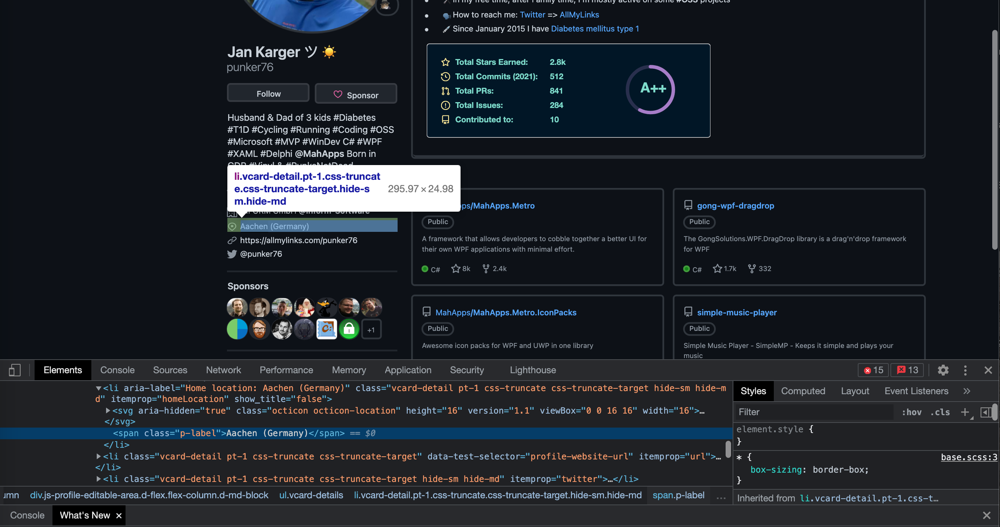

In [80]:
def get_location(doc,status):
    if status==1:
        location = doc.find_all('span',{'itemprop':'location'})
        if(location==[]):
            return '-'
        return(location[0].text)
    loc = doc.find_all('span',{'class':'p-label'})
    if(loc==[]):
        return '-'
    return(loc[0].text.strip())

### Function 9 : **get_no_of_repos ( doc, status )**
In this particular function, the aim is to get the no. of repositories that the developer has ( for organisations, it is not indicated ). *doc* and *status* happen to be same as the ones in the previous function. If the *status* is 1, then clearly it is an organisation and that is why '-' is returned. On the other hand, for developers, 'span' tag is found and the count is extracted from there. The return value happens to be *parse_count(repono[0].text)*, so as to get the answer in pure numbers.  

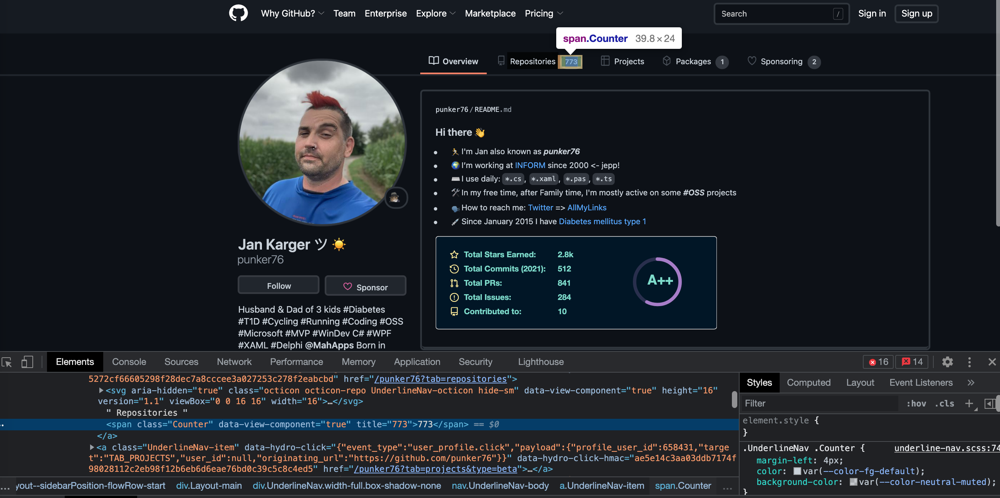

In [81]:
def get_no_of_repos(doc,status): 
    if status==1:
        return '-'
    repono = doc.find_all('span',{'class':'Counter'})
    return(parse_count(repono[0].text))

### Function 10 : **get_no_of_con ( doc, status )**
In this particular function, the aim is to get the no. of contributions that the developer has done in the past year ( organisations don't have this ). *doc* and *status* happen to be same as the ones in the previous function. If the *status* is 1, then clearly it is an organisation and that is why '-' is returned. On the other hand, for developers, 'h2' tag is found and the count is extracted from there. The return value happens to be *parse_count(conno[0].text.split()[0])*, so as to get the answer in pure numbers.  

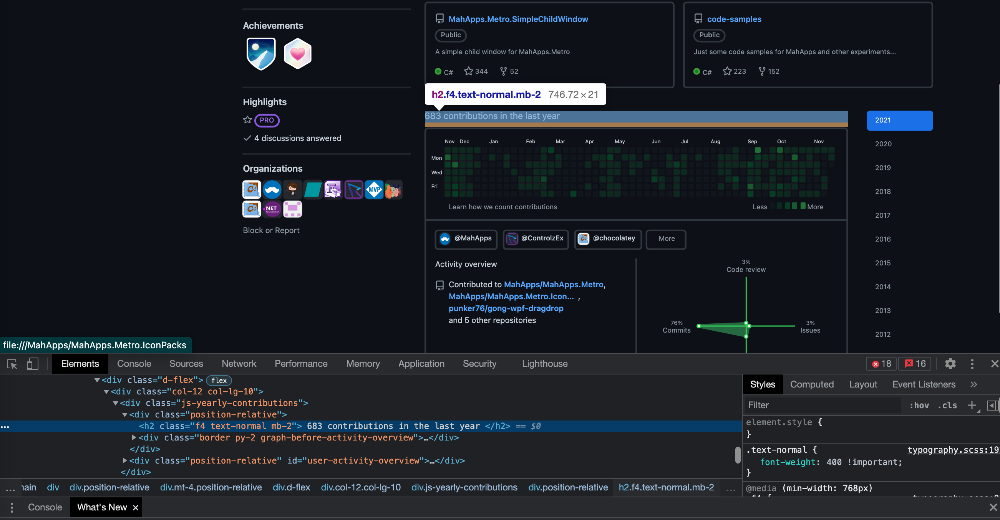

In [82]:
def get_no_of_con(doc,status):
    if status==1:
        return '-'
    conno = doc.find_all('h2',{'class':'f4 text-normal mb-2'})
    return(conno[0].text.split()[0])

### Function 11 : **detail_scrapper( url, details_dict )**

First of all, the argument *url* is actually the url for the personal profile page of a developer/organisation ( the images : 'Profile Pic Dev' and 'Profile Pic Org' above show the webpages ). Also, *details_dict* is a dictionary having the following keys:  
1. 'Full Name'  
2. 'Followers'
3. 'Following'
4. 'No. of stars'
5. 'Location'
6. 'Repositories'
7. 'Contributions (Last Year)'  

All of them have their inital values as empty lists.  

Now, the role of this function is to add values to the lists associated with each of these keys. *requests.get()* and *BeautifulSoup()* functions are used to get the parsed HTML page *doc* ( the status code of response is compulsorily checked before obtaining *doc*; any value other than 200 indicates failure to open the webpage and thus an exception has been kept ready for handling that situation ). *det* below takes two values from the function *get_full_name()* and uses the second of those values to set *status* variable ( 1 means 'organisation' and 0 means 'developer' ). In the rest of the code, *details_dict* values are appended for respective keys.

In [83]:
def detail_scrapper(url,details_dict):
    response = requests.get(url)
    if response.status_code != 200:
        raise Exception('Failed to load page {}'.format(url))
    doc = BeautifulSoup(response.text, 'html.parser')
    det = (get_full_name(doc))
    if(det[1] == 1):
        status = 1
    else:
        status = 0    
    
    
    details_dict['Full Name'].append(det[0])    
    details_dict['Followers'].append(get_followers(doc,status))
    details_dict['Following'].append(get_following(doc,status))
    details_dict['No. of stars'].append(get_no_of_stars(doc,status))
    details_dict['Location'].append(get_location(doc,status))
    details_dict['Repositories'].append(get_no_of_repos(doc,status))
    details_dict['Contributions (Last Year)'].append(get_no_of_con(doc,status))
    return

### Function 12 : **diver( doc, details_dict )**

The *diver()* function actually goes through the GitHub sponsors community page ( *doc* is parsed HTML document for this page ) and goes into each link that leads to a developer's/organisation's profile page. In there, it extracts data about the developer/organisation (like full name, followers, following, no. of stars they have, location, no. of repositories they have and contributions that they made last year) using *detail_scrapper()* function. This is achieved using a for loop that runs for the entire length of *dive*.  

*DataFrame()* function is used to convert *details_dict* dictionary (which is same as the previous function) into a data frame. A *path* variable is declared and initiaised and passed to *to_csv()* function to obtain a csv file with the name 'Github Sponsors Data' ( importing Pandas is necessary for both these actions ). This file is saved in 'Github_Sponsors' folder ( which will be created in the next function ). In the end, a message 'Process Completed Successfully' is displayed to tell the user that extaction was successful. 



In [85]:
   def diver(doc,details_dict):

    dive = doc.find_all('h1',{'class':'h3 lh-condensed'})
    for i in range(len(dive)):
        dive_url = 'https://github.com' + dive[i].find('a')['href']
        print("Collecting data about {}...".format(dive_url.split('/')[-1]))
        detail_scrapper(dive_url,details_dict)

    df = pd.DataFrame(details_dict)
    path = 'Github_Sponsors/{}.csv'.format('Github Sponsors Data')
    df.to_csv(path,index = None)
    print('Process Completed Successfully.')
    return 
   

### Function 13 : **front( )**

This function generates *doc* using *sponsors_url* as shown below ( the proccess being similar to the function before this ). *sponsor_details_dict* has beeen defined here. *makedirs()* function is used here to create 'Github_Sponsors' folder ( importing os is required to do this ). Then, three functions :  
1. *get_usernames()*
2. *get_personal()*
3. *diver()*  

are called and appropriate arguments are passed to them. In the end, *doc* is returned.

In [86]:
def front():
    sponsors_url = 'https://github.com/sponsors/community'
    response = requests.get(sponsors_url)
    if response.status_code != 200:
        raise Exception('Failed to load page {}'.format(sponsors_url))
    doc = BeautifulSoup(response.text, 'html.parser')
    sponsor_details_dict = {
    'Username':[],'Info':[],'Full Name':[],'Followers':[],'Following': [],'No. of stars': [],'Location':[],'Repositories':[],'Contributions (Last Year)': []
    }
    os.makedirs('Github_Sponsors',exist_ok = True)
    get_usernames(doc,sponsor_details_dict)
    get_personal_info(doc,sponsor_details_dict)
    diver(doc,sponsor_details_dict)
    return doc

### Function 14 : **individual_repos( url )**
This function takes a url as its argument and obtains a parsed HTML document called *doc*. The role of this function is to extract the name of top repositories and their links. *user_repo_dict* has been defined here with 'Repo Name' and 'URL' as its keys that have empty lists as its values initially. To obtain the repo names and their links, 'h3' tags are found using *find_all()* function and the required information is extracted.  


Developer:  

  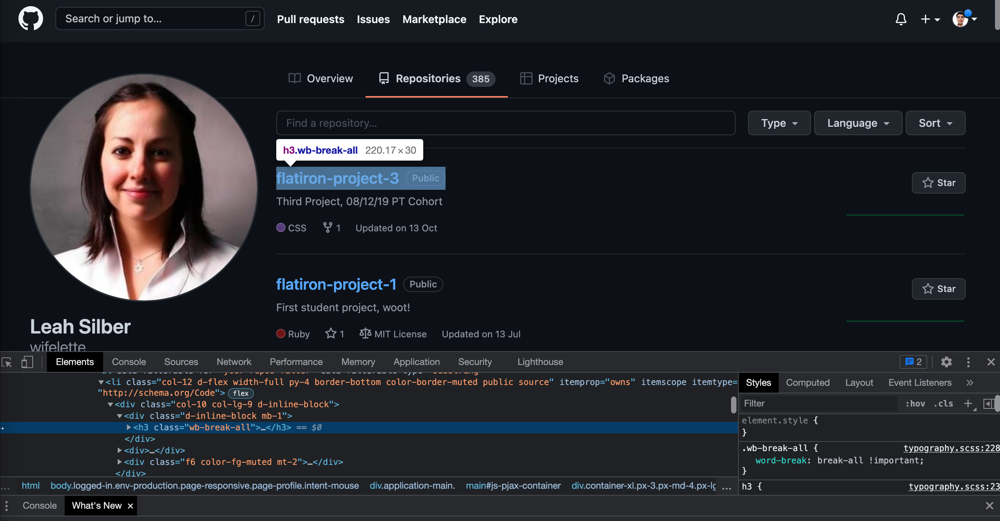

Organisation:  

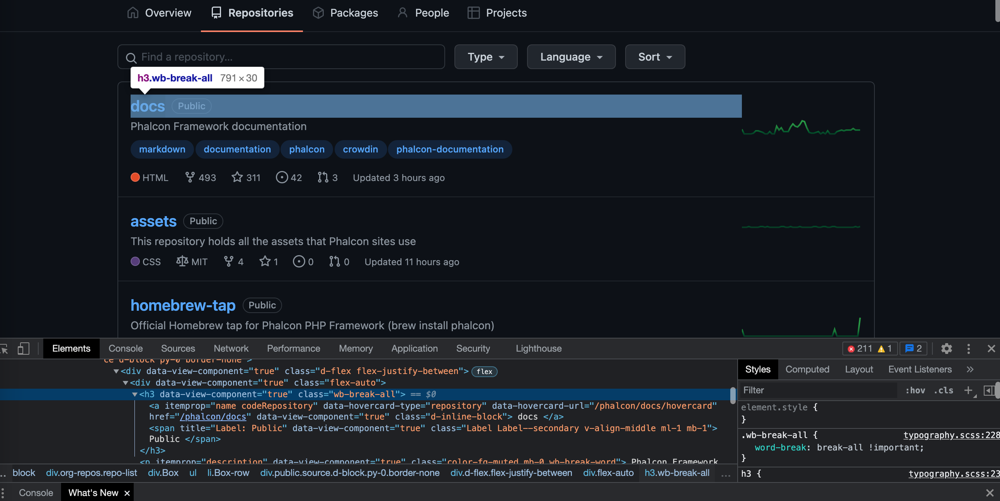   


The dictionary defined is used to store all the names and links as shown in the code below.
The *if* case covers the scenario when then the url happens to be of a developer's repository page. In that case the url will be something like : https://github.com/tpope?tab=repositories and we have to extract 'tpope' from it.  
The *else* case on the other hand, covers the scenario when the url happens to be of a organisation's repository page. In that case the url will be something like : https://github.com/orgs/phalcon/repositories and we have to extract 'phalcon' from it.  
In case the details about the repositories of a developer or an organsation already exists in Github_Sponsors folder ( checked by *os.path.exists()* function ), the creation of the file is called off ( and appropriate message is displayed ). Otherwise, the *user_repo_dict* is converted to a data frame, which in turn is converted to a csv file and saved in Github_Sponsors folder with the name of the developer or organisation.  

In [87]:
def individual_repos(url):
    response = requests.get(url)
    if response.status_code != 200:
        raise Exception('Failed to load page {}'.format(url))
    doc = BeautifulSoup(response.text, 'html.parser')
    user_repo_dict = {'Repo Name':[],'URL':[]}    
    repname = doc.find_all('h3',{'class':'wb-break-all'})
    for i in range(len(repname)):
        user_repo_dict['URL'].append('https://github.com' + repname[i].find('a')['href'])
        user_repo_dict['Repo Name'].append(repname[i].find('a').text.strip())
    
    if(url.split('/')[-1]!='repositories'):
        pname = url.split('/')[-1].split('?')[0]
    else:
        pname = url.split('/')[-2]
    path = 'Github_Sponsors/{}.csv'.format(pname)
    if os.path.exists(path):
        print("The file {} already exists. Skipping....".format(path))
        return
              

    pd.DataFrame(user_repo_dict).to_csv(path,index=None)
    return

### Function 15 : **individual( doc )**  
The *doc* argument is basically parsed HTML document of [sponsors](https://github.com/sponsors/community) page where 'h1' tags are searched so as to get links to each developer's/organisation's profile page.  
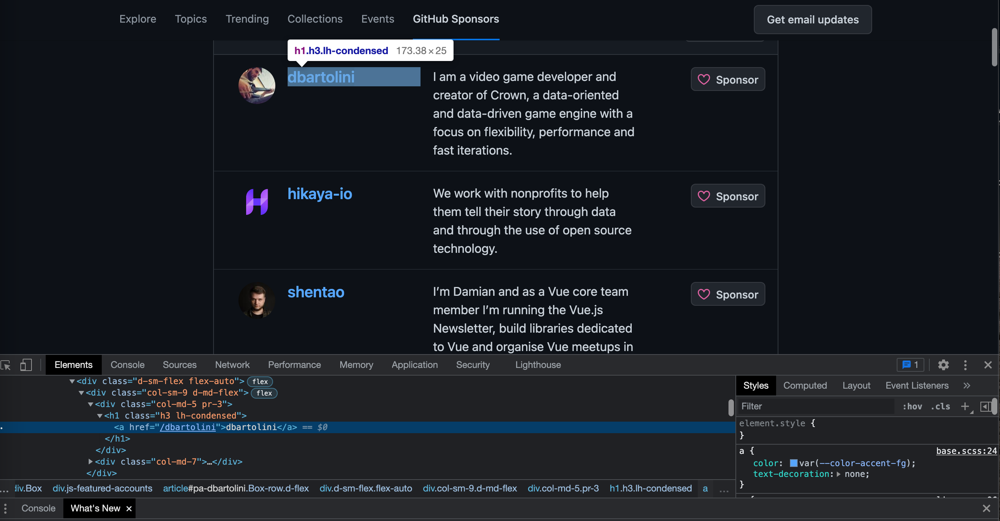
Using a for loop, repositories page of each developer/organisation is accessed. *time.sleep()* function is used to delay program execution by 3 seconds so as to give sufficient time for the repositories webpage to load ( importing time is necessary for this ). It also displays whose profile page it is currently in by displaying "Extracting data about xyz's repositories" for the user. The first 'if else' is to determine the status of the page (status 1 indicates page of an organisation and status 0 indicates page of a developer). The second 'if else' is to get the link of the organisation's/developer's repositories page based on the status.  

For a developer : 


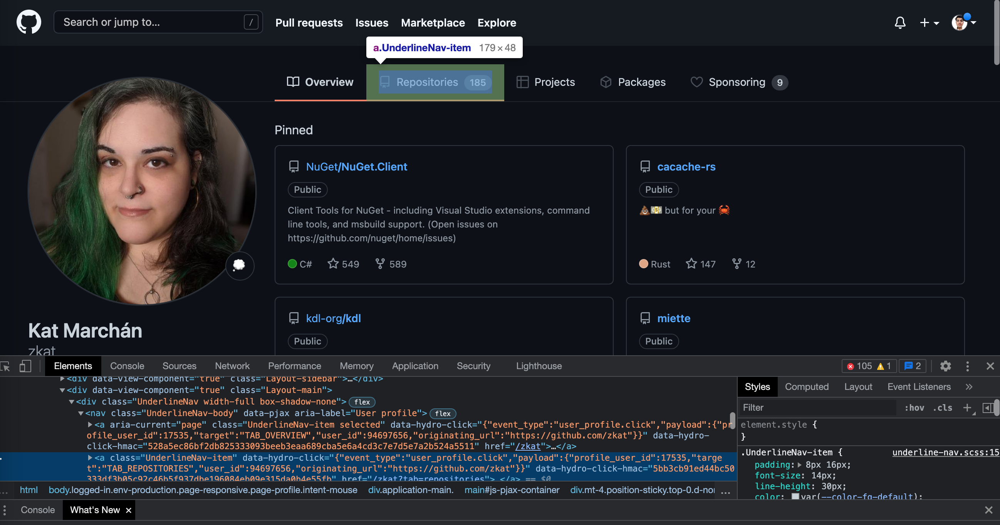  


For an organisation :

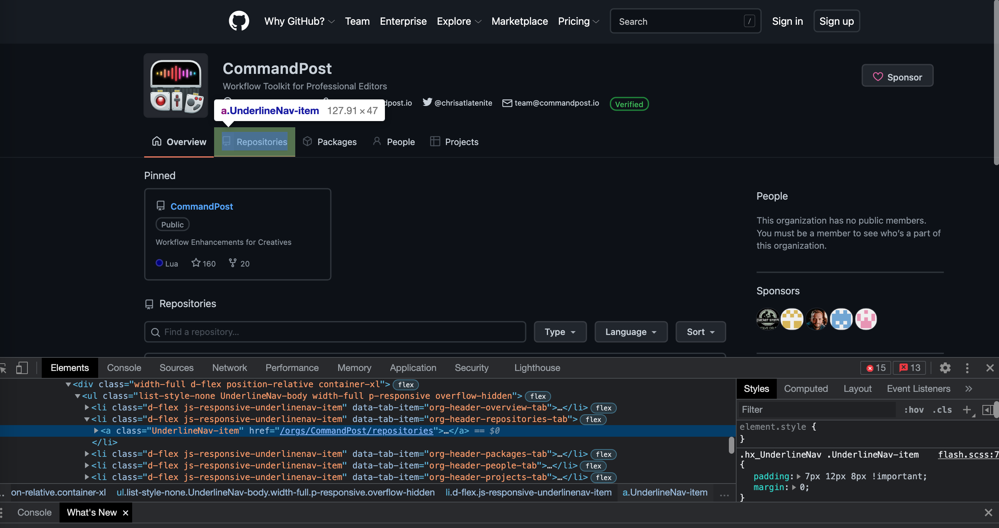  

As the url is obtained of the repositories page, it is passed as an argument to *individual_repos()* function to get top repo names and their links saved in a file.  
Ultimately, the message "Process Completed Successfully" indicates to the user that the entire function worked successfully.  


In [88]:
   
def individual(doc):
    dive = doc.find_all('h1',{'class':'h3 lh-condensed'})
    for i in range(len(dive)):
        dive_url = 'https://github.com' + dive[i].find('a')['href']
        time.sleep(3)
        response = requests.get(dive_url)
        if response.status_code != 200:
            raise Exception('Failed to load page {}'.format(dive_url))
        doc = BeautifulSoup(response.text, 'html.parser')
        print("Extracting data about {}'s repositories".format(dive_url.split('/')[-1]))
        det = (get_full_name(doc))
        if(det[1] == 1):
            status = 1
        else:
            status = 0
        
        if status == 0:
            repo_link = doc.find_all('div',{'class':'UnderlineNav width-full box-shadow-none'})
            rep = repo_link[0].find_all('nav',{'class':'UnderlineNav-body'})[0].find_all('a',{'class':'UnderlineNav-item'})[1]['href']
        else: 
            repo_link = doc.find_all('div',{'class':'width-full d-flex position-relative container-xl'})
            rep = repo_link[0].find_all('li',{'class':'d-flex js-responsive-underlinenav-item'})[1].find_all('a',{'class':'UnderlineNav-item'})[0]['href']
        url = 'https://github.com' + rep
        individual_repos(url)
    print('Process Completed Successfully.')
    return

### Function 16 : **GitHub_Sponsors( )**  

This is the main driving function of the entire program. In it, *front()* is called and the return value of *front()* is used as an argument for the *individual()* function. That is all.


In [89]:
 
def GitHub_Sponsors():
    individual(front())


In [71]:
GitHub_Sponsors()

Process Completed Successfully.
Extracting data about raysan5's repositories
Extracting data about flarum's repositories
Extracting data about chaynHQ's repositories
Extracting data about foosel's repositories
Extracting data about phalcon's repositories
Extracting data about panva's repositories
Extracting data about sindresorhus's repositories
Extracting data about shentao's repositories
Extracting data about sanderstad's repositories
Extracting data about tenancy's repositories
Extracting data about Akryum's repositories
Extracting data about Eugeny's repositories
Extracting data about Mariatta's repositories
Extracting data about vaidehijoshi's repositories
Extracting data about curl's repositories
Extracting data about hikaya-io's repositories
Extracting data about EbookFoundation's repositories
Extracting data about fletch3555's repositories
Extracting data about Brawrdon's repositories
Extracting data about claui's repositories
Extracting data about potatoqualitee's repositories